In [71]:
import torch
import cv2
from segment_anything import SamAutomaticMaskGenerator, sam_model_registry, SamPredictor
import numpy as np
import matplotlib.pyplot as plt
import glob
import torch
import clip
from PIL import Image
from tqdm import tqdm
import functions as fnc
from importlib import reload
import skimage
from skimage.measure import label, regionprops, regionprops_table
import pandas as pd
import math
import numba as nb

In [2]:
OutDIR='/DATA/vito/output/'
DataDIR='/DATA/vito/data/'
MODEL_TYPE = "vit_h"

if torch.cuda.is_available():
    DEVICE = torch.device('cuda:0')
    print('Currently running on GPU\nModel '+MODEL_TYPE)
else:
    DEVICE = torch.device('cpu')
    print('Currently running on CPU\nModel '+MODEL_TYPE)

if MODEL_TYPE == 'vit_h':
    CHECKPOINT_PATH = DataDIR+'MetaSAM/sam_vit_h_4b8939.pth'
elif MODEL_TYPE == 'vit_l':
    CHECKPOINT_PATH = DataDIR+'MetaSAM/sam_vit_l_0b3195.pth'
else:
    CHECKPOINT_PATH = DataDIR+'MetaSAM/sam_vit_b_01ec64.pth'

sam = sam_model_registry[MODEL_TYPE](checkpoint=CHECKPOINT_PATH)
sam.to(device=DEVICE)
mask_generator = SamAutomaticMaskGenerator(sam)


Currently running on GPU
Model vit_h


In [3]:
fn_img = glob.glob(DataDIR+'drone_ortho/*')
fn_img.sort()
print('Available images:')
for i, fn in enumerate(fn_img):
    print(f'{i}:' + fn.split("/")[-1])
print("---------------")
img_select=int(input("Select a image: "))
image = cv2.imread(fn_img[img_select])
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
print(fn_img[img_select].split("/")[-1]+' imported')

Available images:
0:512patched_LaPaya.npy
1:512patched_mask.npy
2:LaPaya_Apr2024_03May24_orthomosaic_5cm_UTM19S_WGS84.tif
3:LaPaya_Apr2024_orthomosaic_5cm_UTM19S_WGS84.tif
4:Ravi1_Orthomosaic_0.2mm.tif
5:Ravi2_Orthomosaic_0.2mm.tif
6:big_clip.tif
7:small_clip1.tif
8:small_clip2.tif
---------------
big_clip.tif imported


In [4]:
crop_size=512
i,j=0,2
cropped_image=image[crop_size*i:crop_size*(i+1),crop_size*j:crop_size*(j+1),:]
cropped_image.shape

(512, 512, 3)

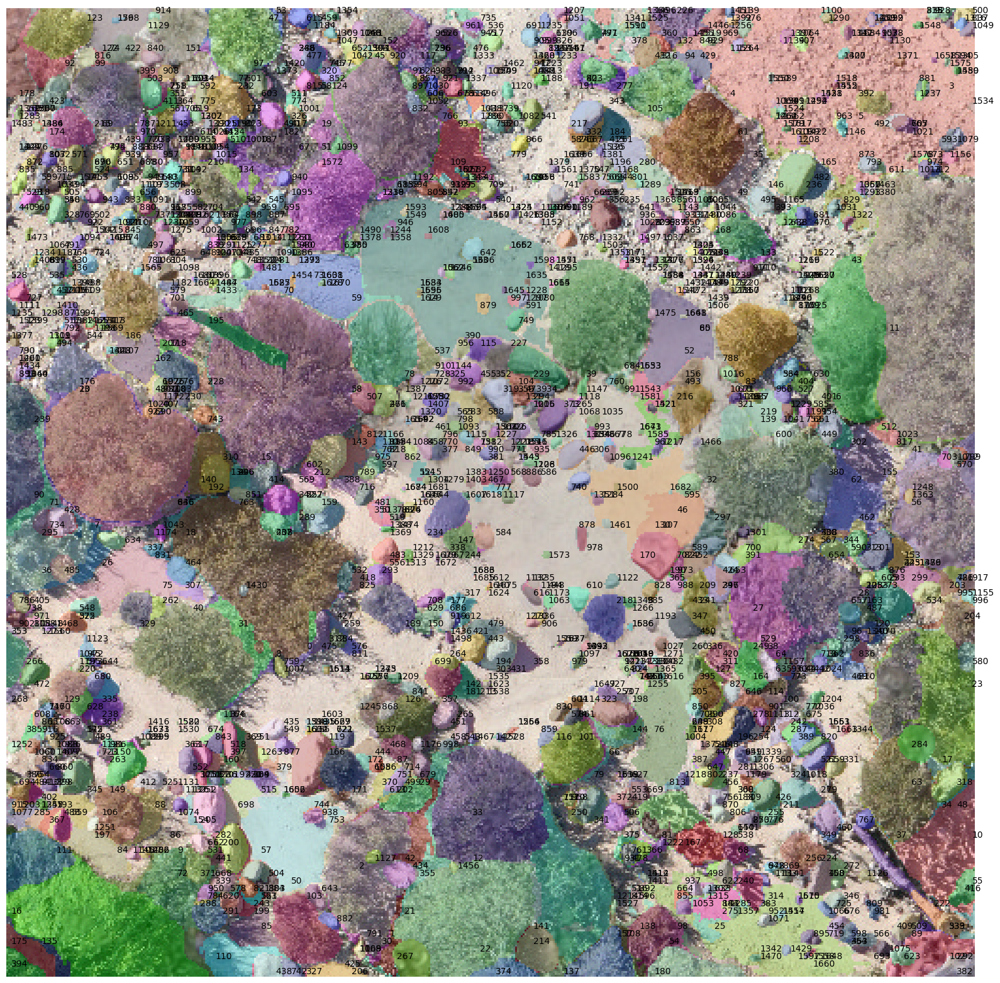

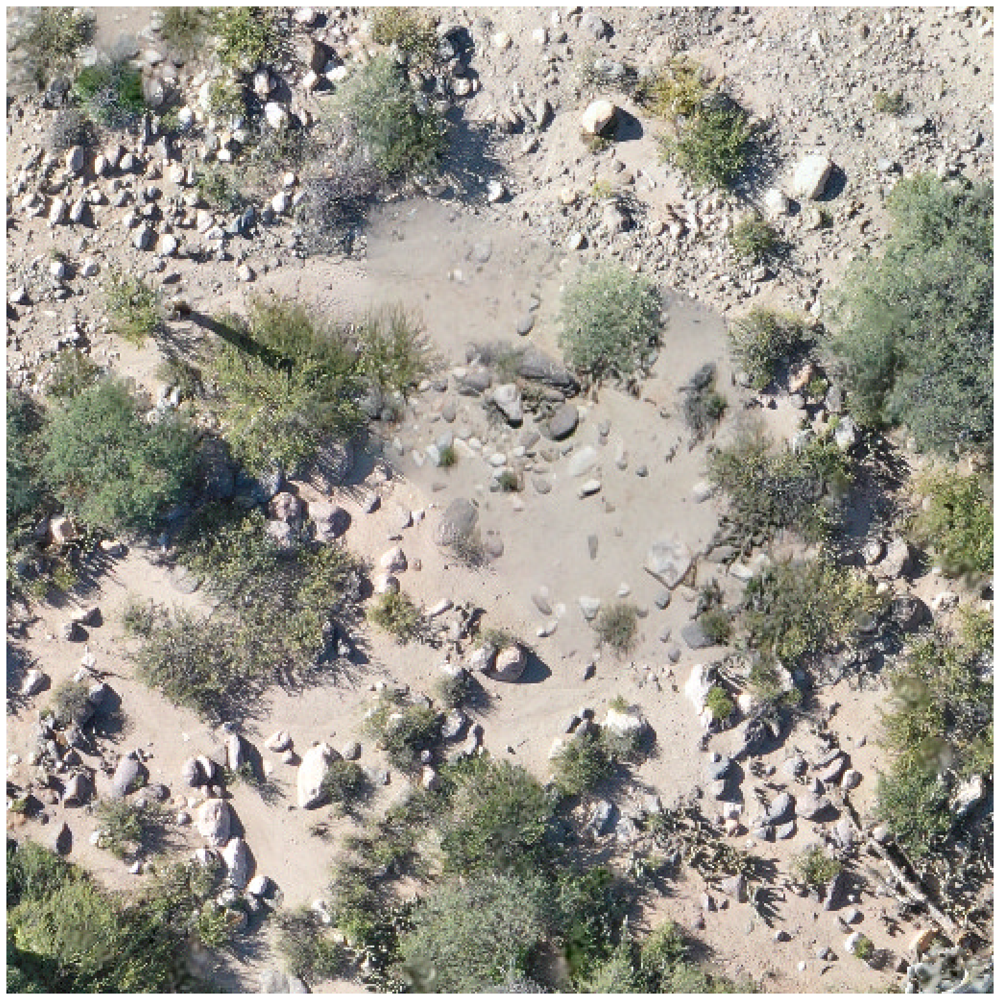

In [155]:
mask_generator = SamAutomaticMaskGenerator(
    model=sam,
    points_per_side=128,
    pred_iou_thresh=0.75,
    stability_score_thresh=0.75,
    crop_n_layers=0,
    crop_n_points_downscale_factor=0,
    crop_overlap_ratio=0,
    min_mask_region_area=50,
)
masks = fnc.samplot(cropped_image, mask_generator)

In [6]:
temp_ar=np.zeros((512,512))
for sg in masks:
    m = sg['segmentation']
    temp_ar[m] +=1

In [7]:
np.unique(temp_ar)

array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10.])

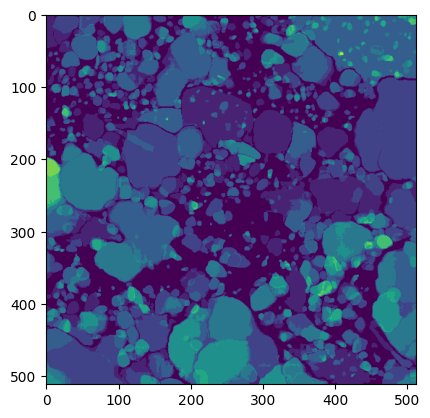

In [8]:
plt.imshow(temp_ar)

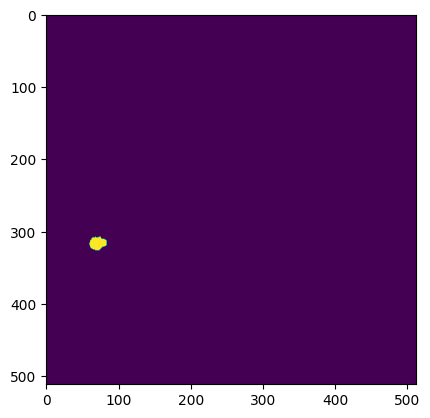

In [20]:
plt.imshow(masks[700]['segmentation'])

In [27]:
label_img = label(temp_ar)
regions = regionprops(label_img)

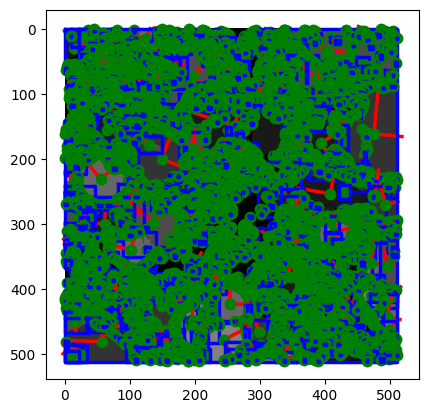

In [32]:
fig, ax = plt.subplots()
ax.imshow(temp_ar, cmap=plt.cm.gray)

for props in regions:
    y0, x0 = props.centroid
    orientation = props.orientation
    x1 = x0 + math.cos(orientation) * 0.5 * props.axis_minor_length
    y1 = y0 - math.sin(orientation) * 0.5 * props.axis_minor_length
    x2 = x0 - math.sin(orientation) * 0.5 * props.axis_major_length
    y2 = y0 - math.cos(orientation) * 0.5 * props.axis_major_length

    ax.plot((x0, x1), (y0, y1), '-r', linewidth=2.5)
    ax.plot((x0, x2), (y0, y2), '-r', linewidth=2.5)
    ax.plot(x0, y0, '.g', markersize=15)

    minr, minc, maxr, maxc = props.bbox
    bx = (minc, maxc, maxc, minc, minc)
    by = (minr, minr, maxr, maxr, minr)
    ax.plot(bx, by, '-b', linewidth=2.5)

plt.show()

In [156]:
list_of_masks = [mask['segmentation'].astype(np.uint8) for mask in masks if
                                 mask['segmentation'][:, 0].sum() +
                                 mask['segmentation'][:, -1].sum() + mask['segmentation'][0, :].sum() +
                                 mask['segmentation'][-1, :].sum() == 0]


In [10]:
#shape_filter
list_of_filtered_masks = []
for i in range(len(list_of_masks)):
    labels_of_masks = skimage.measure.label(list_of_masks[i])
    props = skimage.measure.regionprops_table(labels_of_masks, properties=['label', 'area', 'solidity'])
    if len(props.get('label')) == 1 and (props.get('area') < 400 or props.get('solidity') > 0.95):
        list_of_filtered_masks.append(list_of_masks[i])
list_of_masks = list_of_filtered_masks


In [11]:
temp_ar2=np.zeros((512,512))
for sg in list_of_masks:
    m = sg
    temp_ar2[m] +=1

In [24]:
array_of_masks = np.stack(list_of_masks, axis=-1)
masks=array_of_masks

In [82]:
@nb.jit(cache=True)
def nb_unique_caller(input_data):
    '''Numba compatible solution to numpy.unique() function'''

    data = input_data.copy()

    for i in range(data.shape[1] - 1, -1, -1):
        sorter = data[:, i].argsort(kind="mergesort")
        # mergesort to keep associations
        data = data[sorter]

    idx = [0]

    bool_idx = ~np.all((data[:-1] == data[1:]), axis=1)
    additional_uniques = np.nonzero(bool_idx)[0] + 1

    idx = np.append(idx, additional_uniques)

    return data[idx]


/tmp/ipykernel_1183851/3768957420.py:1: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @nb.jit(cache=True)


In [83]:
stepsize=1

dfs_properties = []
for m, mask in enumerate(np.moveaxis(masks, -1, 0)):
    dfs_properties.append(
        pd.DataFrame(regionprops_table(mask.astype('uint8'), cropped_image[:, :, 0], properties=
        ('area', 'area_convex', 'axis_major_length', 'axis_minor_length', 'bbox', 'centroid', 'centroid_local',
         'centroid_weighted', 'eccentricity', 'equivalent_diameter_area', 'euler_number', 'extent',
         'feret_diameter_max', 'inertia_tensor', 'inertia_tensor_eigvals', 'intensity_max', 'intensity_mean',
         'intensity_min', 'moments_hu', 'moments_weighted_hu', 'orientation', 'perimeter',
         'perimeter_crofton', 'solidity'))))
df = pd.concat(dfs_properties)
df['unit'] = 'cm'
df['mask'] = np.arange(df.shape[0])
df['mask_index'] = np.arange(df.shape[0])
column_to_move = df.pop("mask_index")
df.insert(0, "mask_index", column_to_move)
df = df.set_index('mask')

pixels_per_unit = 0.1
units_per_pixel = 1 / pixels_per_unit
df['num_pixels'] = df['area'].astype(int)
for property in ['equivalent_diameter_area', 'feret_diameter_max',
                 'perimeter', 'perimeter_crofton']:
    df[property] *= units_per_pixel
for property in ['area', 'area_convex']:
    df[property] *= units_per_pixel ** 2
df['scaling [px/unit]'] = pixels_per_unit

df = df.round({
    'area': 1, 'area_convex': 1, 'axis_major_length': 1,
    'axis_minor_length': 1, 'centroid-0': 1, 'centroid-1': 1,
    'centroid_local-0': 1, 'centroid_local-1': 1,
    'centroid_weighted-0': 1, 'centroid_weighted-1': 1, 'eccentricity': 3,
    'equivalent_diameter_area': 1, 'extent': 3, 'feret_diameter_max': 1,
    'inertia_tensor-0-0': 1, 'inertia_tensor-0-1': 1,
    'inertia_tensor-1-0': 1, 'inertia_tensor-1-1': 1,
    'inertia_tensor_eigvals-0': 1, 'inertia_tensor_eigvals-1': 1,
    'intensity_max': 1, 'intensity_mean': 1, 'intensity_min': 1,
    'moments_hu-0': 3, 'moments_hu-1': 3, 'moments_hu-2': 3,
    'moments_hu-3': 3, 'moments_hu-4': 3, 'moments_hu-5': 3,
    'moments_hu-6': 3, 'moments_weighted_hu-0': 3,
    'moments_weighted_hu-1': 3, 'moments_weighted_hu-2': 3,
    'moments_weighted_hu-3': 3, 'moments_weighted_hu-4': 3,
    'moments_weighted_hu-5': 3, 'moments_weighted_hu-6': 3,
    'orientation': 3, 'perimeter': 1, 'perimeter_crofton': 1,
    'scaling [px/unit]': 2, 'solidity': 3})

print('Detecting areas with overlap.')
flattened_multiple_masks = masks[masks.sum(axis=-1) > 1]
unique_multiple_masks = nb_unique_caller(flattened_multiple_masks[::stepsize])

print('Processing areas with overlap:')

df['overlap'] = 0
df['overlapping_masks'] = [set() for _ in range(len(df))]

overlap_counts = np.zeros(len(df), dtype=int)

for n, unique in enumerate(unique_multiple_masks):

    print(f'Area {n + 1}/{len(unique_multiple_masks)}', sep=',',
        end='\r' if n + 1 < len(unique_multiple_masks) else '\n', flush=True)

    mask_indices = np.where(unique)[0]

    for idx in mask_indices:
        df.at[idx, 'overlapping_masks'].update(mask_indices)

    summed_masks = masks[:, :, mask_indices].sum(axis=-1)
    overlaps = (summed_masks > 1).sum(axis=(0, 1))

    overlap_counts[mask_indices] += overlaps

df['overlap'] = overlap_counts
df['number_of_overlapping_masks'] = df['overlapping_masks'].apply(len)

df['number_of_overlapping_masks'] = [len(masks) for masks in df['overlapping_masks'].to_list()]

Detecting areas with overlap.


/tmp/ipykernel_1183851/3768957420.py:1: NumbaWarning: 
Compilation is falling back to object mode WITH looplifting enabled because Function "nb_unique_caller" failed type inference due to: No implementation of function Function(<function all at 0x7f3a2c11b700>) found for signature:
 
 >>> all(array(bool, 2d, C), axis=Literal[int](1))
 
There are 2 candidate implementations:
      - Of which 2 did not match due to:
      Overload in function 'np_all': File: numba/np/arraymath.py: Line 801.
        With argument(s): '(array(bool, 2d, C), axis=int64)':
       Rejected as the implementation raised a specific error:
         TypingError: got an unexpected keyword argument 'axis'
  raised from /DATA/vito/.venv/lib/python3.8/site-packages/numba/core/typing/templates.py:784

During: resolving callee type: Function(<function all at 0x7f3a2c11b700>)
During: typing of call at /tmp/ipykernel_1183851/3768957420.py (14)


File "../../../tmp/ipykernel_1183851/3768957420.py", line 14:
<source missing,

Processing areas with overlap:
Area 9328/9328


In [86]:
df

,mask_index,area,area_convex,axis_major_length,axis_minor_length,bbox-0,bbox-1,bbox-2,bbox-3,centroid-0,...,orientation,perimeter,perimeter_crofton,solidity,unit,num_pixels,scaling [px/unit],overlap,overlapping_masks,number_of_overlapping_masks
mask,,,,,,,,,,,,,,,,,,,,,
0,0,5700.0,6100.0,11.6,6.4,207,273,216,283,210.7,...,-0.894,275.6,288.1,0.934,cm,57,0.1,1035,"{0, 226, 324, 1023}",4
1,1,20400.0,22300.0,19.6,13.8,295,369,314,384,303.4,...,0.177,554.6,552.6,0.915,cm,204,0.1,8309,"{1, 580, 969, 464, 279}",5
2,2,16100.0,19600.0,21.3,10.5,323,243,335,264,327.5,...,1.531,558.7,560.4,0.821,cm,161,0.1,3978,"{1393, 2, 490, 1148}",4
3,3,7000.0,7400.0,13.0,6.9,477,165,487,177,481.8,...,0.972,312.1,322.7,0.946,cm,70,0.1,0,{},0
4,4,5900.0,6800.0,11.8,7.0,471,454,482,463,476.3,...,0.550,301.4,312.6,0.868,cm,59,0.1,649,"{4, 223}",2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1422,1422,3100.0,3200.0,7.3,5.4,329,450,335,456,331.4,...,0.745,182.4,199.8,0.969,cm,31,0.1,186,"{452, 1422}",2
1423,1423,1100.0,1100.0,4.3,3.1,148,217,152,220,149.6,...,0.263,94.1,116.1,1.000,cm,11,0.1,52,"{1412, 1294, 1423, 1424, 1205}",5
1424,1424,1400.0,1600.0,5.0,3.5,148,216,153,220,150.0,...,0.000,116.6,137.3,0.875,cm,14,0.1,65,"{1412, 1294, 1423, 1424, 1205}",5


In [ ]:
file_p = files_folder / (Path(filepath).stem + '_raw_dataframe.csv')
df.to_csv(file_p, encoding='utf-8', header='true', index=False)
save_dictionary(filepath, {'scale': pixels_per_unit, 'unit': unit})



In [88]:
reshaped_masks=np.moveaxis(masks, -1, 0)
weighted_masks = (reshaped_masks * np.arange(1, reshaped_masks.shape[0] + 1)[:, np.newaxis, np.newaxis])

In [91]:
weighted_masks[9]

array([ 0, 10])

In [107]:
filter_conditions = {'min_area': math.floor(df['area'].min()),
            'max_area': math.ceil(df['area'].max()),
            'min_solidity': 0.95,
            'overlap': math.ceil(df['overlap'].max()),
            'overlapping_masks': 'Not'}

filters = {'min_area': math.floor(df['area'].min()),
            'max_area': math.ceil(df['area'].max()),
            'min_solidity': math.floor(df['solidity'].min()),
            'max_solidity': math.ceil(df['solidity'].max()),
            'min_intensity': math.floor(df['intensity_mean'].min()),
            'max_intensity': math.ceil(df['intensity_mean'].max()),
            'min_eccentricity': math.floor(df['eccentricity'].min()),
            'max_eccentricity': math.ceil(df['eccentricity'].max()),
            'overlap': math.ceil(df['overlap'].max()),
            'overlapping_masks': "Not applied",
            'scaling': df['scaling [px/unit]'].to_list()[1]}

filters.update(filter_conditions)

filtered_df = df[((df['area'] >= filters['min_area']) & (df['area'] <= filters['max_area']) &
                    (df['solidity'] >= filters['min_solidity']) & (df['solidity'] <= filters['max_solidity']) &
                    (df['intensity_mean'] >= filters['min_intensity']) & (
                                df['intensity_mean'] <= filters['max_intensity']) &
                    (df['eccentricity'] >= filters['min_eccentricity']) & (
                                df['eccentricity'] <= filters['max_eccentricity']) &
                    (df['number_of_overlapping_masks'] == filters['overlapping_masks'] if type(
                        filters['overlapping_masks']) == int
                    else df['number_of_overlapping_masks'] >= 0) & (df['overlap'] <= filters['overlap']))]

filters.update({'removed': df.shape[0] - filtered_df.shape[0], 'remain': filtered_df.shape[0]})


In [108]:
filters

{'min_area': 100,
 'max_area': 275100,
 'min_solidity': 0.95,
 'max_solidity': 1,
 'min_intensity': 41,
 'max_intensity': 241,
 'min_eccentricity': 0,
 'max_eccentricity': 1,
 'overlap': 31649,
 'overlapping_masks': 'Not',
 'scaling': 0.1,
 'removed': 915,
 'remain': 512}

In [109]:
filtered_label_image = np.zeros(weighted_masks[0].shape)
for n in filtered_df.index.to_list():
    filtered_label_image += weighted_masks[n]


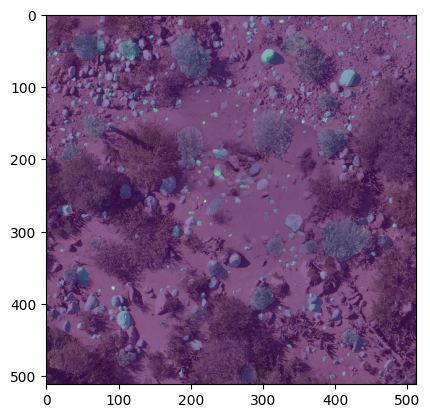

In [111]:
plt.imshow(cropped_image)
plt.imshow(filtered_label_image, alpha=0.6)

In [119]:
np.unique(list_of_masks[0])

array([0, 1], dtype=uint8)

In [123]:
label=0
while label in np.unique(list_of_masks[0]):
    print(f'{label} is in use')
    label+=1
    
print(f'{label}'+' is the newest unused label')

0 is in use
1 is in use
2 is the newest unused label


In [148]:
test=np.ones((3,3))
print(test)
test2=np.ones((3,3))
test2*=4
print(test2)
test1=test+test2
print(test1)

[[1. 1. 1.]
 [1. 1. 1.]
 [1. 1. 1.]]
[[4. 4. 4.]
 [4. 4. 4.]
 [4. 4. 4.]]
[[5. 5. 5.]
 [5. 5. 5.]
 [5. 5. 5.]]


In [164]:
aggregated_mask=np.zeros(list_of_masks[0].shape)
label=0
for i in np.arange(0,len(masks),1):
    #identify used labels
    current_labels=np.unique(aggregated_mask)
    while label in current_labels: 
        label+=1 #cant use this approach since overlapping can still potentially cause reuse label
    #label=current_labels.max()+1
    print(f'Current label: {current_labels.max()}, label: {label}', sep=',',
        end='\r' if i + 1 < len(masks) else '\n', flush=True)
    aggregated_mask[masks[i]['segmentation']]+=label
    

Current label: 18084.0, label: 2222


In [141]:
range(len(list_of_masks))

range(0, 1427)

In [149]:
current_labels

array([ 0., inf])

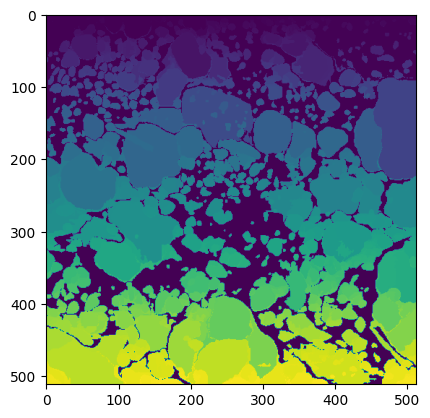

In [171]:
labeled_aggregated_masks=skimage.measure.label(aggregated_mask)
plt.imshow(labeled_aggregated_masks)

In [172]:
labeled_aggregated_masks.max()

8102

In [166]:
np.unique(aggregated_mask, return_counts=True)

(array([0.0000e+00, 1.0000e+00, 2.0000e+00, ..., 1.5947e+04, 1.6372e+04,
        1.8084e+04]),
 array([59982,     5,    19, ...,     8,     3,     3]))

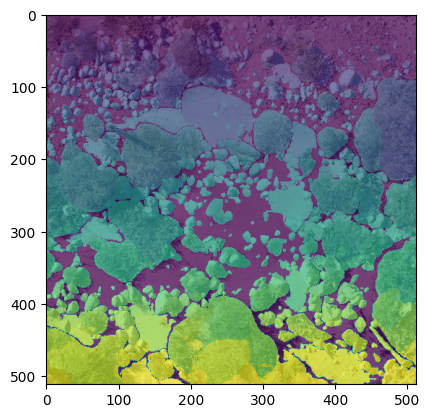

In [173]:
plt.imshow(cropped_image)
plt.imshow(labeled_aggregated_masks, alpha=0.7)

In [180]:
model_list=clip.available_models()
print('Available clip models:')
for i, M in enumerate(model_list):
    print(f'{i}:' + M)
print("---------------")
model, preprocess = clip.load(model_list[7], device=DEVICE)
print(model_list[7]+' loaded')

Available clip models:
0:RN50
1:RN101
2:RN50x4
3:RN50x16
4:RN50x64
5:ViT-B/32
6:ViT-B/16
7:ViT-L/14
8:ViT-L/14@336px
---------------
ViT-L/14 loaded


In [185]:
#label prob

kmean_apply=False
WithBackground=False
BG='White'
#BG='Black

if (not WithBackground) or kmean_apply:
    if BG=='White':
        fill_value=255
    else:
        fill_value=0

#load image
pil_image = Image.fromarray(cropped_image)
numpy_array = np.array(pil_image)
if kmean_apply:
    numpy_array[kmean_mask==0]=fill_value

#define possible labels
labels=["rock", "sand", "vegetation", "bushes", "desert", "ground"]
#labels=["bushes", "sand"]
text = clip.tokenize(labels).to(DEVICE)

#output
probabilities = []
clip_probability_mask=np.zeros(cropped_image.shape[:-1])
 
#run prediction
for i in range(labeled_aggregated_masks.max()):
    temp_mask=labeled_aggregated_masks==i

    #cropping
    notzero_indices = np.nonzero(temp_mask)
    x_min = np.min(notzero_indices[0]).astype(int)
    x_max = np.max(notzero_indices[0]).astype(int)
    y_min = np.min(notzero_indices[1]).astype(int)
    y_max = np.max(notzero_indices[1]).astype(int)
    if WithBackground:
        clip_masked_image=numpy_array[x_min-5:x_max+5, y_min-5:y_max+5,:]
    else:
        #masking
        masked_image = np.copy(numpy_array)
        masked_image[temp_mask == 0] = fill_value
        clip_masked_image=masked_image[x_min-5:x_max+5, y_min-5:y_max+5,:]


    #convert back to PIL
    if ((clip_masked_image.shape[0]!=0)&(clip_masked_image.shape[1]!=0)):
        preprocessed_pil_image = Image.fromarray(clip_masked_image)

        #predict
        pre_image = preprocess(preprocessed_pil_image).unsqueeze(0).to(DEVICE)
        with torch.no_grad():
            image_features = model.encode_image(pre_image)
            text_features = model.encode_text(text)
    
            logits_per_image, logits_per_text = model(pre_image, text)
            probs = logits_per_image.softmax(dim=-1).cpu().numpy()
            clip_probability_mask[temp_mask]=probs[0][0]
    else:
        probabilities.append(np.nan)

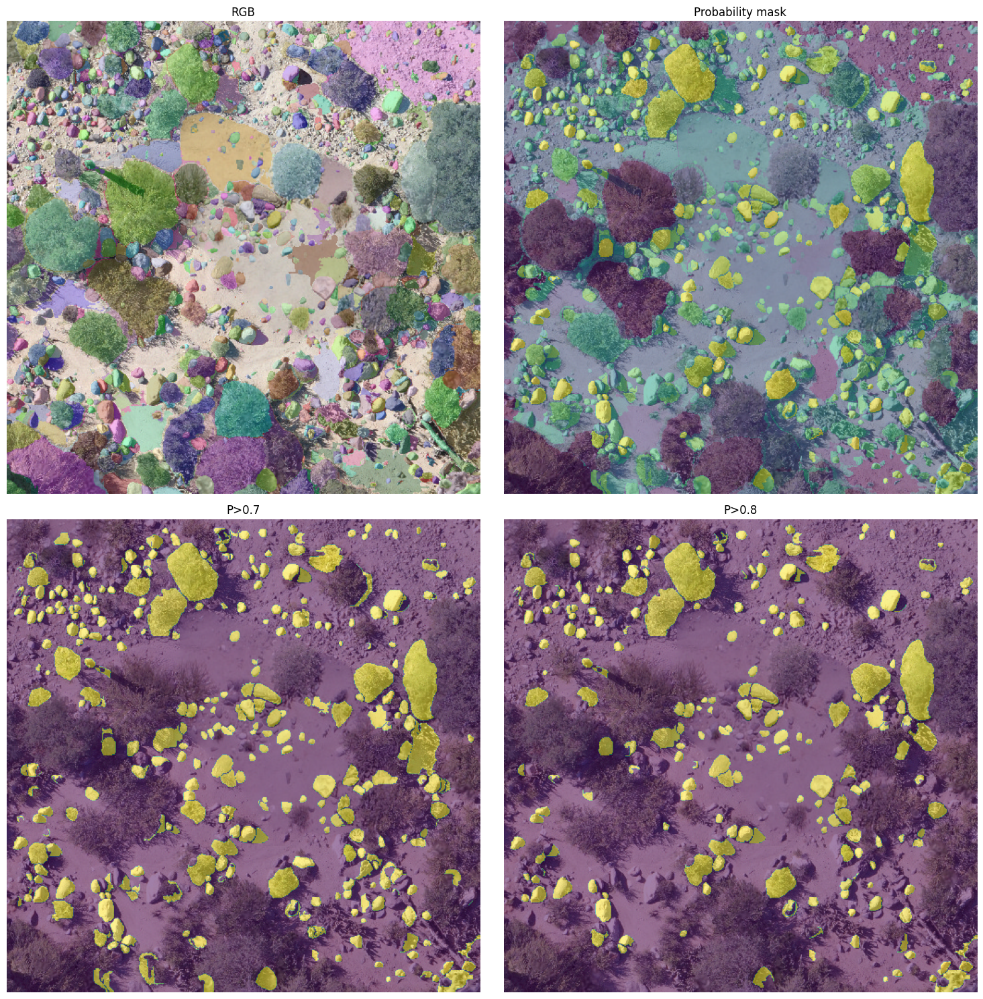

In [188]:
fnc.clip_plotting(cropped_image,clip_probability_mask, masks,0.7,0.8)